In [2]:
import sys
sys.path.insert(0, '..')

In [3]:
import os
from os import makedirs
import pandas as pd
import random
from random import shuffle
import time
from keras.optimizers import SGD, adadelta, adagrad, adam, adamax, nadam
from keras.callbacks import ModelCheckpoint, TensorBoard, CSVLogger, ReduceLROnPlateau
from keras import backend as K
from os.path import join, exists
import matplotlib.pyplot as plt

from pyphoon.app.preprocess import DefaultImagePreprocessor
from pyphoon.interpolation.data import read_chunk
from pyphoon.interpolation.model import get_model, get_unet, get_model2
from pyphoon.interpolation.triplets_generator import TripletsGenerator

Using TensorFlow backend.
/usr/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [4]:
model_name = 'Unet_256x256'
train_dir = '/root/fs9/grishin/datasets/triplets/train/'
test_dir = '/root/fs9/grishin/datasets/triplets/test/'
tensorboard_path = '/root/fs9/grishin/datasets/triplets/{0}/tensorboard/'.format(model_name)
train_dataset = '/root/fs9/grishin/database/triplets_training_set.csv'
results_dir = '/root/fs9/grishin/results/triplets/{0}/'.format(model_name)
weights_path = join(results_dir, 'weights.hdf5')
log_dir = join(results_dir, 'logs')
plots_dir = join(results_dir, 'plots')
if not exists(results_dir):
    makedirs(results_dir)
if not exists(log_dir):
    makedirs(log_dir)    
if not exists(plots_dir):
    makedirs(plots_dir)    

In [6]:
# Learning parameters
LEARNING_RATE = 0.0001
BATCH_SIZE = 16
NUM_EPOCHS = 200
NUM_CHANNELS = 1
NWORKERS = 1

# Loading training data
img_width, img_height = 256, 256
target_size = (img_width, img_height)
training_data_df = pd.read_csv(train_dataset)
df_train = training_data_df.loc[training_data_df['test'] == False]
df_valid = training_data_df.loc[training_data_df['test'] == True]
train_generator = TripletsGenerator(df_train, BATCH_SIZE, target_size, 0)
validation_generator = TripletsGenerator(df_valid, BATCH_SIZE, target_size, 0)

# Creating model
model = get_model2(input_shape=(img_width, img_height, 2))
if exists(weights_path):
    model.load_weights(weights_path)
    print('weights file loaded.')

def charbonnier(y_true, y_pred):
    return K.sqrt(K.square(y_true - y_pred) + 0.001**2)

optimizer = adam(lr=LEARNING_RATE, beta_1=0.9, beta_2=0.999, epsilon=1e-08)
loss = charbonnier
model.compile(loss=loss, optimizer=optimizer)

../pyphoon/interpolation/model.py:107: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  merge6 = merge([drop4, up6], mode='concat', concat_axis=3)
/usr/local/lib/python3.6/dist-packages/keras/legacy/layers.py:458: UserWarning: The `Merge` layer is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  name=name)
../pyphoon/interpolation/model.py:113: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  merge7 = merge([conv3, up7], mode='concat', concat_axis=3)
../pyphoon/interpolation/model.py:119: UserWarning: The `merge` function is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  merge8 = merge([conv2, up8], mode='con

weights file loaded.


In [7]:
# Tensorboard
tensorboard = TensorBoard(
    log_dir=log_dir,
    write_grads=True,
    write_graph=True,
    write_images=True
)

callbacks = [
    ModelCheckpoint(filepath=weights_path, monitor='loss',
                    save_best_only=True, verbose=1),
    ReduceLROnPlateau(monitor="loss", factor=0.5, patience=20, verbose=1),
    tensorboard
]

nbatches_train, mod = divmod(df_train.shape[0], BATCH_SIZE)
nbatches_valid, mod = divmod(df_valid.shape[0], BATCH_SIZE)


## Training

In [13]:
model.fit_generator(
    generator=train_generator,
    steps_per_epoch=nbatches_train,
    epochs=NUM_EPOCHS,
    validation_data=validation_generator,
    validation_steps=nbatches_valid,
    workers=NWORKERS,
    callbacks=callbacks)


Epoch 1/200
  11/8040 [..............................] - ETA: 1:29:26 - loss: 0.0458

KeyboardInterrupt: 

## Evaluation

In [8]:
def save_plot(index, prefix):
    min_diff_val = (im1[index] - im2[index]).min()
    max_diff_val = (im1[index] - im2[index]).max()
    plt.figure(figsize=(20, 10))
    plt.subplot(241)
    plt.title('Left')
    plt.axis('off')
    plt.imshow(im1[index], cmap="Greys")
    plt.subplot(242)
    plt.title('Right')
    plt.axis('off')
    plt.imshow(im2[index], cmap="Greys")
    plt.subplot(243)
    plt.title('Diff Left, Right')
    plt.axis('off')
    plt.imshow(im1[index] - im2[index], cmap="seismic")
    plt.subplot(247)
    plt.title('Interpolated')
    plt.axis('off')
    plt.imshow(interpolated[index], cmap="Greys")
    plt.subplot(245)
    plt.title('Prediction')
    plt.axis('off')
    plt.imshow(prediction[index, :, :, 0], cmap="Greys")
    plt.subplot(246)
    plt.title('Ground Truth')
    plt.axis('off')
    plt.imshow(Y[index, :, :, 0], cmap="Greys")
    plt.subplot(244)
    plt.title('Diff GT, Interp')
    plt.axis('off')
    diff1 = interpolated[index]-Y[index, :, :, 0]
    plt.imshow(diff1, cmap="seismic", vmin=min_diff_val, vmax=max_diff_val)
    plt.subplot(248)
    plt.title('Diff GT, Predict')
    plt.axis('off')
    diff2 = prediction[index, :, :, 0]-Y[index, :, :, 0]
    plt.imshow(diff2, cmap="seismic", vmin=min_diff_val, vmax=max_diff_val)
    plt.savefig('{}_{}.eps'.format(prefix, index), format='eps')
    plt.plot()

def linear_interp(im1, im2):
    return (im1 + im2)/2.0

In [9]:
batch_num = 0
X, Y = validation_generator[batch_num]
im1 = X[:, :, :, 0]
im2 = X[:, :, :, 1]
interpolated = linear_interp(im1, im2)
prediction = model.predict(X)
interp_error = abs(interpolated - Y[:,:,:,0])
predict_error = abs(prediction[:,:,:,0] - Y[:,:,:,0])

/usr/local/lib/python3.6/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


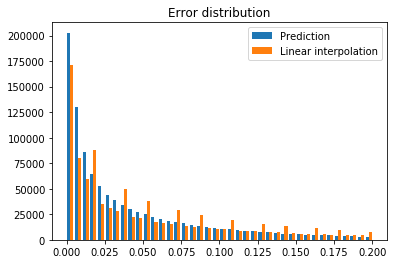

In [16]:
predict_error_flatten = predict_error.flatten()
interp_error_flatten = interp_error.flatten()
plt.hist([predict_error_flatten, interp_error_flatten],  bins=40, 
         label=['Prediction', 'Linear interpolation'], histtype='bar', range=(0, 0.2))
plt.legend()
plt.plot()
plt.title('Error distribution')
plt.savefig(join(plots_dir, '{0}_error_hist.eps'.format(model_name)))

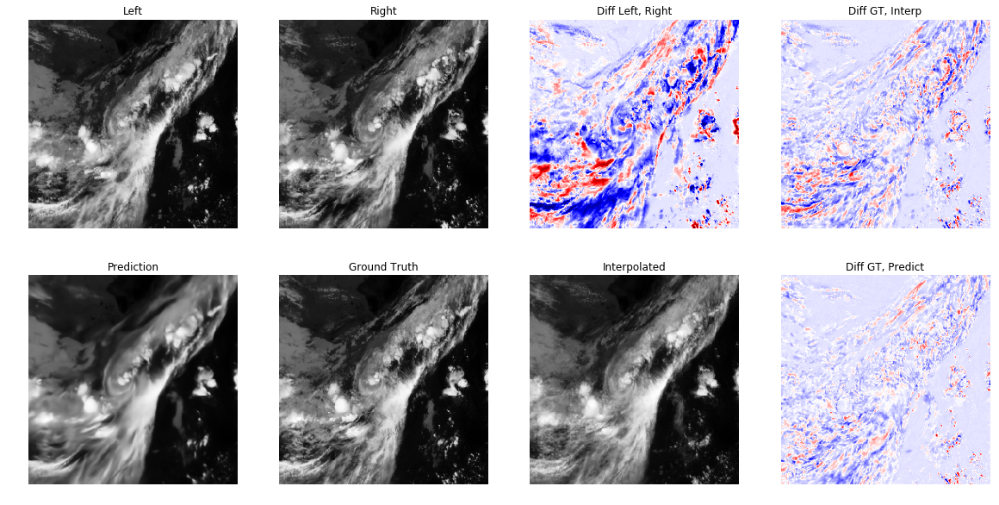

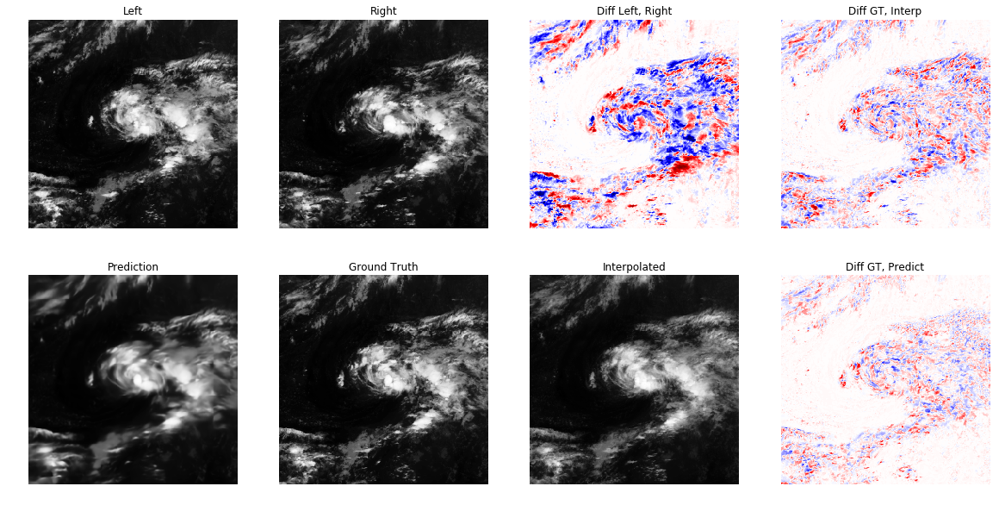

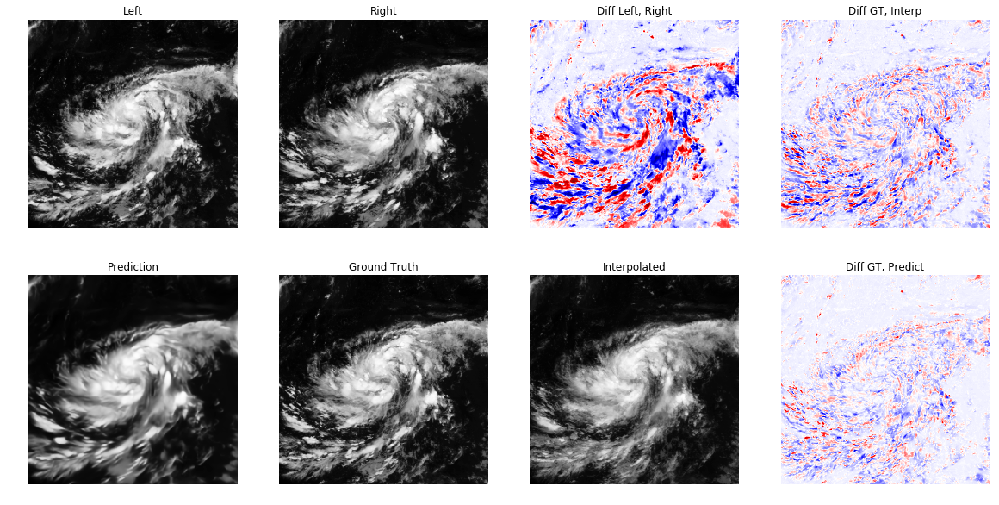

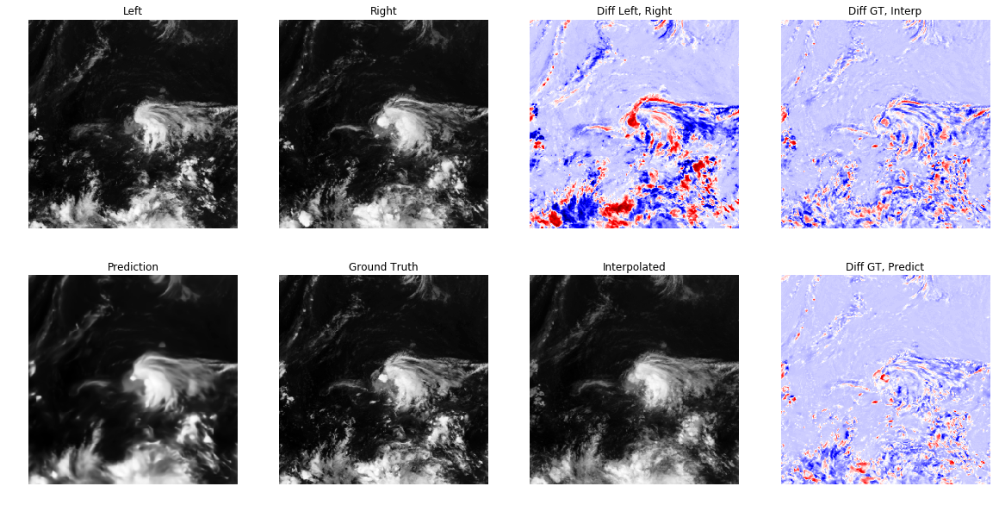

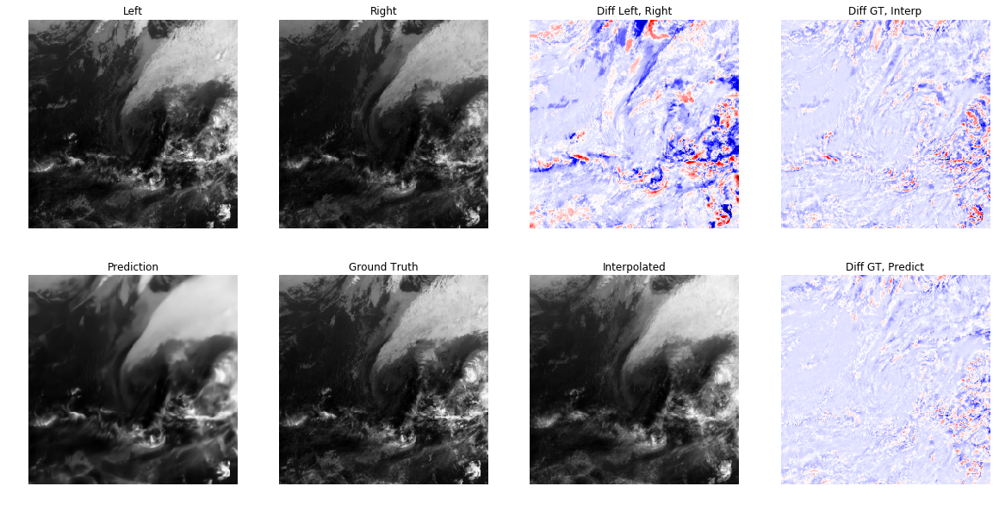

...

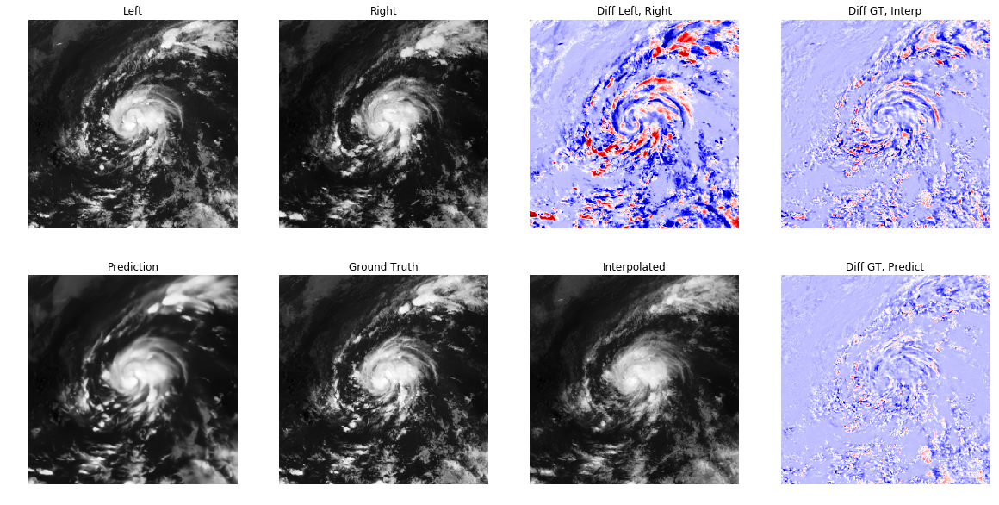

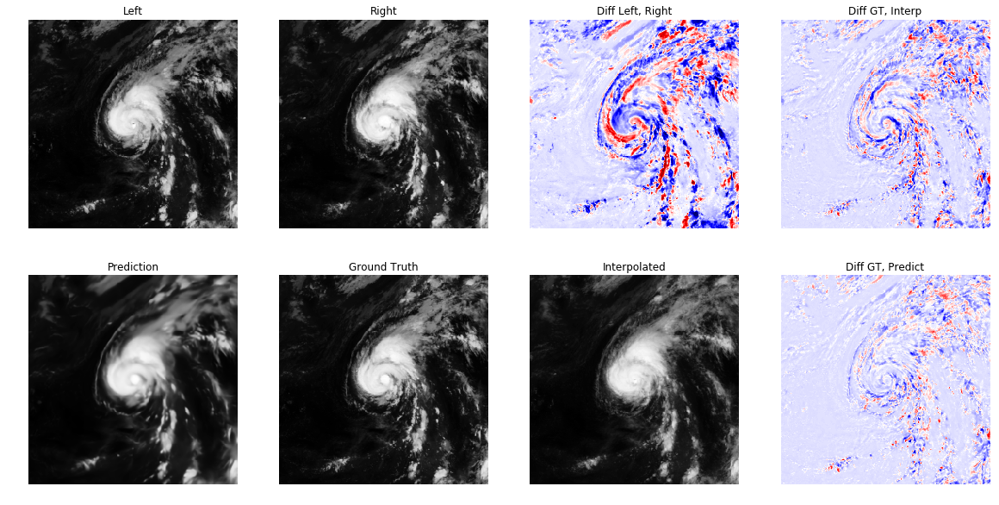

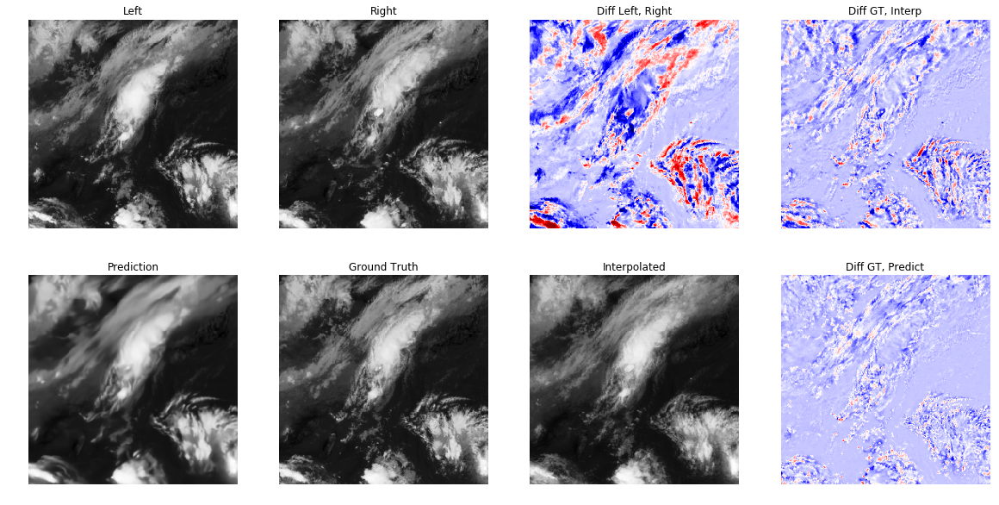

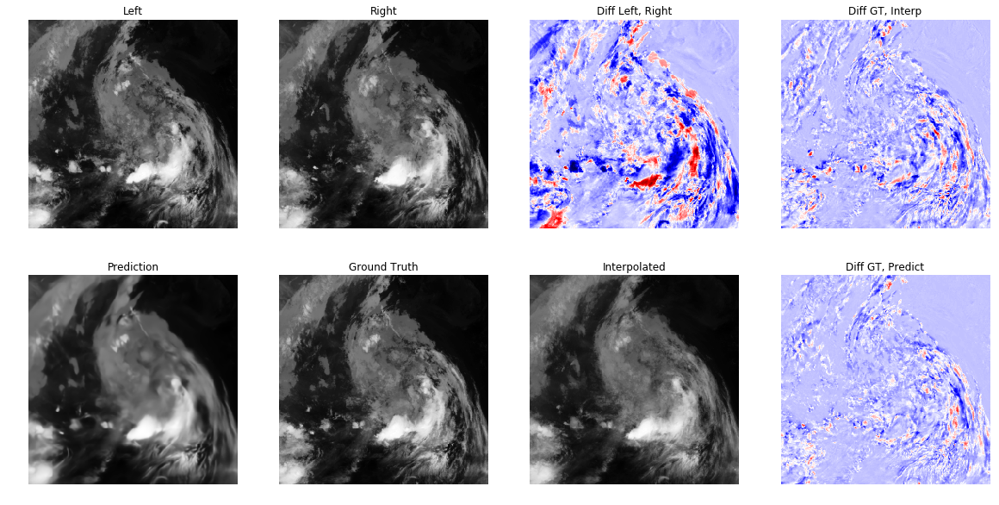

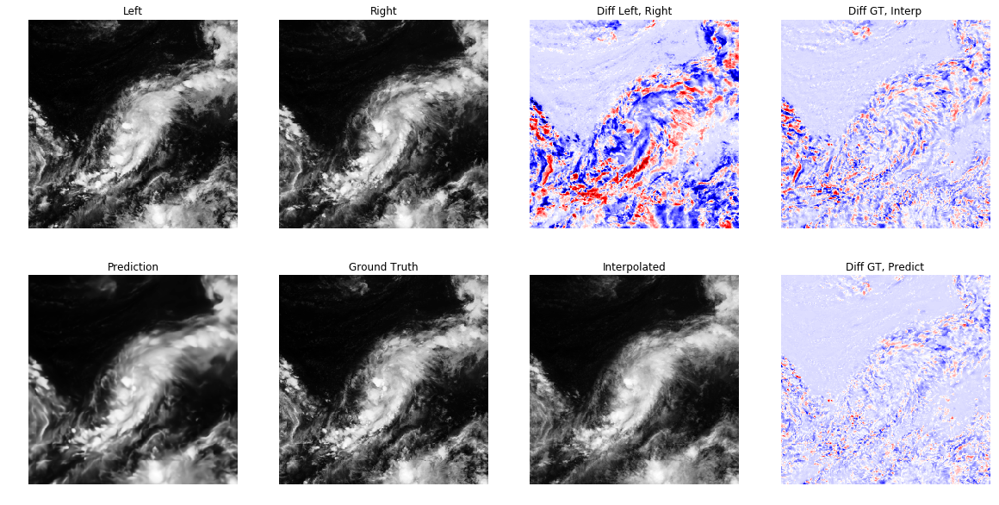

In [17]:
for i in range(len(X)):
    save_plot(i, join(plots_dir, '{0}_output.eps'.format(model_name)))

## Evaluation using results as input to regression model

In [10]:
from architecture import pressureRegressionModel
model_p = pressureRegressionModel()
model_p.load_weights(join(results_dir, 'regression/weights-improvement-09-8.02.hdf5'))

ModuleNotFoundError: No module named 'architecture'